In [1]:
import matplotlib.pyplot as plt
import numpy as np
from Read.Read import open_record
from Filtering import Basic_filters as bf
from Read.Read_zenodo import open_record as open_record_z
import time
import spkit as sp
from scipy.signal import periodogram as psd
import scipy.io
from sklearn.metrics import mutual_info_score
import seaborn as sns
import pandas as pd
import sys
import sklearn as sk

Making the annotations

In [2]:
annotations=scipy.io.loadmat("D:/FYP/Zenodo EEG/zenodo_eeg/annotations_2017.mat")
fs=128

valid_ans={}
Files=[str(i) for i in range(2,25)]+[str(i) for i in range(26,62)]+[str(i) for i in range(63,80)] 
#plotting the first 5 annotations
for i in range(79):
    y0=annotations["annotat_new"][0]
    y1=y0[i]
    y2=y1[0]
    y3=y1[1]
    y4=y1[2]
    
    #y=np.multiply(np.multiply(y2,y3),y4)
    y=(y2&y3)|(y2&y4)|(y3&y4)
    #checking if y contains only 0s
    if np.any(y) and (str(i+1) in Files):
        valid_ans[str(i+1)]=np.repeat(y,fs)

loading the dataset

In [3]:
def signal_array(raw_data):
    ch1=raw_data[0]-raw_data[5]
    ch2=raw_data[5]-raw_data[7]
    ch3=raw_data[0]-raw_data[2]
    ch4=raw_data[2]-raw_data[7]
    ch5=raw_data[1]-raw_data[3]
    ch6=raw_data[3]-raw_data[8]
    ch7=raw_data[1]-raw_data[6]
    ch8=raw_data[6]-raw_data[8]
    ch9=raw_data[5]-raw_data[2]
    ch10=raw_data[2]-raw_data[4]
    ch11=raw_data[4]-raw_data[3]
    ch12=raw_data[3]-raw_data[6]
    return np.array([ch1,ch2,ch3,ch4,ch5,ch6,ch7,ch8,ch9,ch10,ch11,ch12])

valid_ans_keys=list(valid_ans.keys())
Channels=[[i] for i in range(19)] #zenodo

X=np.empty((len(Channels),))

record_num=3                                                    #input here
X,t=open_record_z(rec_num=valid_ans_keys[record_num],frs=fs,out="all-channels")
X=signal_array(X)

#normalizing X
mu_X=np.mean(X,axis=1)
sigma_X=np.std(X,axis=1)
X=(X.T-np.array([mu_X])).T/np.array([sigma_X]).T
clean_array=bf.appy_basics(X.copy(),btype="bandpass",frs=fs)

Extracting EDF parameters from D:\FYP\Zenodo EEG\zenodo_eeg\eeg9.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


d:\FYP\Code\Read\Read_zenodo.py:7: RuntimeWarning: Invalid date encountered (2000-00-00 00:00:00).


Using fastICA to decompose the signal X into 12 sources (learning the mixing matrix)

In [4]:
from sklearn.decomposition import PCA, FastICA

t1=35000
t2=t1+fs*12
ica = FastICA(n_components=12, whiten="unit-variance")
S_ = ica.fit_transform(clean_array[:,t1:t2].T)  # Reconstruct signals
A_ = ica.mixing_  # Get estimated mixing matrix
print(S_.shape,A_.shape)

(1536, 12) (12, 12)


In [5]:
import joblib
from sklearn.decomposition import PCA, FastICA
from scipy.stats import kurtosis,skew,entropy
from numpy.lib.stride_tricks import sliding_window_view


In [6]:
def hj_mobility(data,axis_=1):
    return np.sqrt(np.var(np.diff(data,axis=axis_),axis=axis_)/np.var(data,axis=axis_))

def hj_complexity(data,axis_=1):
    return hj_mobility(np.diff(data,axis=axis_),axis_=axis_)/hj_mobility(data,axis_=axis_)

def predict_artefact_class(model,data_i):
    #normalise the data_i array
    #t1=time.time()
    mu_i=np.mean(data_i,axis=1)
    mu_i=mu_i.reshape(mu_i.shape[0],1)
    sigma_i=np.std(data_i,axis=1)
    sigma_i=sigma_i.reshape(sigma_i.shape[0],1)
    data_i=(data_i-mu_i)/sigma_i

    #mobility
    hj_mob_i=hj_mobility(data_i)
    hj_mob_i=hj_mob_i.reshape(hj_mob_i.shape[0],1)

    #complexity
    hj_comp_i=hj_complexity(data_i)
    hj_comp_i=hj_comp_i.reshape(hj_comp_i.shape[0],1)

    #skew
    skewness_i=skew(data_i,axis=1)**2
    skewness_i=skewness_i.reshape(skewness_i.shape[0],1)

    #kurtosis
    kurtosis_i=kurtosis(data_i,axis=1)**2
    kurtosis_i=kurtosis_i.reshape(kurtosis_i.shape[0],1)
    data_i=np.hstack((hj_mob_i,skewness_i,kurtosis_i,hj_comp_i)).T

    #predict
    pred=model.predict(data_i.T)
    #print(model.predict_proba(data_i.T))
    #t2=time.time()
    #print("time taken: ",t2-t1)

    return pred

Plotting the signals to sources

In [7]:
model=joblib.load("D:/FYP/Code/Practise Code/random_forest.joblib")


Brain percentage for channel 0 : 0.7010148321623731
[1 1 1 ... 1 1 1]
[1 1 1 ... 1 1 1]


ValueError: could not broadcast input array from shape (1281,) into shape (0,)

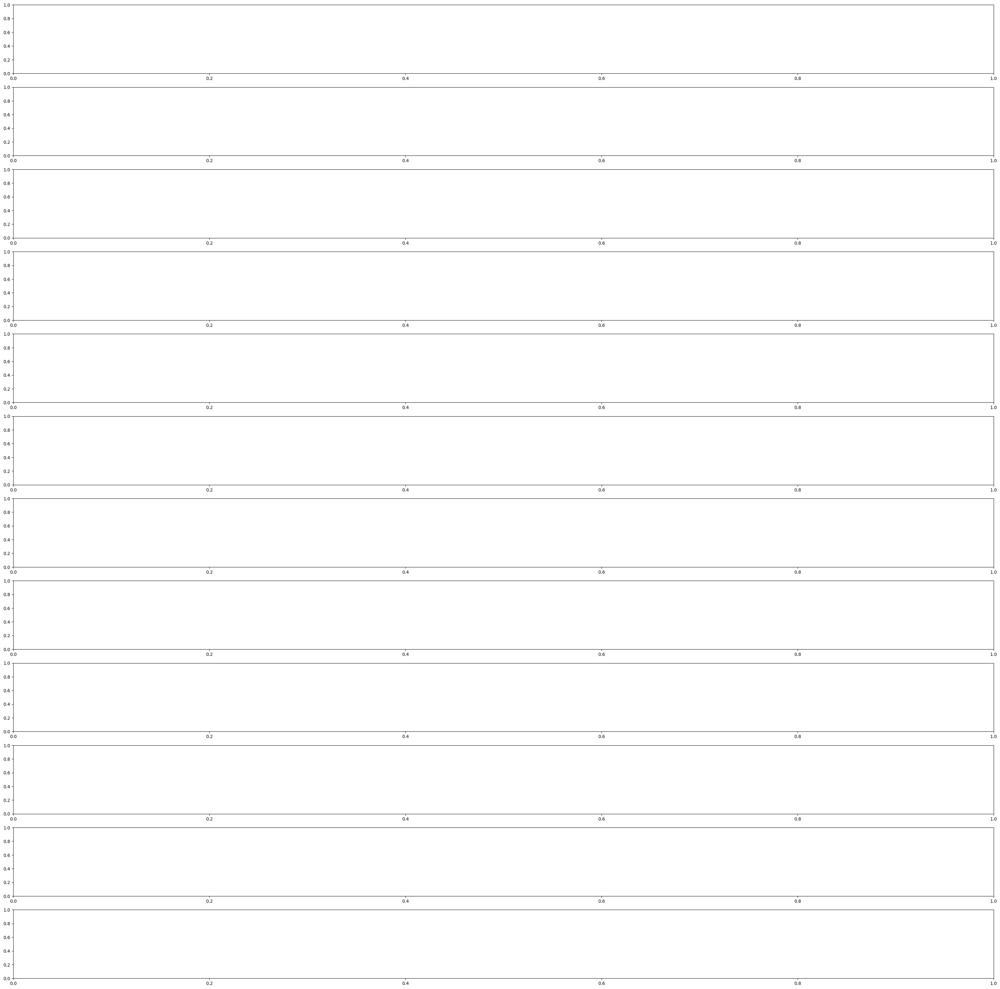

In [75]:
ax,fig=plt.subplots(12,1,figsize=(40,40))
#making a reference signal for plotting (average of all 12 signals)
ref=np.mean(clean_array,axis=0)*4
cmap = plt.cm.viridis
#there should be 12 plots on top of original signal
for i in range(12):
    sig_art=np.multiply(ref[t1:t2],valid_ans[valid_ans_keys[record_num]][t1:t2])
    t_art=np.multiply(t[t1:t2],valid_ans[valid_ans_keys[record_num]][t1:t2])
    epochs=sliding_window_view(S_.T[i,:],window_shape=(fs*2,))
    prediction=predict_artefact_class(model,epochs)
    brain_percentages=np.sum(prediction)/prediction.shape[0]
    print("Brain percentage for channel",i,":",brain_percentages)
    bg_color =np.ones((fs*12,),dtype=int)
    bg_color=np.ndarray.flatten(bg_color)
    #print(bg_color)
    #print(prediction)
    bg_color=prediction*100
    fig[i].imshow(bg_color[np.newaxis,:], cmap="plasma", aspect="auto")
    fig[i].plot(ref[t1:t2])
    fig[i].plot(sig_art,color="orange")
    fig[i].plot(S_.T[i,:],color="red")
    print(sig_art.shape,bg_color.shape)
    fig[i].set_title("ICA component "+str(i+1))
    fig[i].set_xlabel("Time (s)")
    fig[i].set_ylabel("Amplitude")
plt.tight_layout()
plt.show()


In [133]:
import mne
from mne.preprocessing import ICA
from mne.preprocessing import corrmap

n_channels = 12
sampling_freq = 128  # in Hertz
ch_names=["ch1","ch2","ch3","ch4","ch5","ch6","ch7","ch8","ch9","ch10","ch11","ch12"]
ch_types=["eeg"]*12
info = mne.create_info(ch_names,ch_types=ch_types, sfreq=sampling_freq,verbose=False)
raw = mne.io.RawArray(clean_array[:,t1:t2], info,verbose=False)
filt_raw = raw.copy().filter(l_freq=1.0, h_freq=30.0,verbose=False)

ica = ICA(
    n_components=12,
    max_iter="auto",
    verbose=False)
ica.fit(filt_raw,verbose=False)
eog_inds, eog_scores = ica.find_bads_eog(filt_raw, ch_name='ch1',verbose=False)



C:\Users\ASUS\AppData\Local\Temp\ipykernel_15596\3555247273.py:17: RuntimeWarning: Using n_components=12 (resulting in n_components_=12) may lead to an unstable mixing matrix estimation because the ratio between the largest (8) and smallest (1.8e-21) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 8


In [134]:
print(eog_inds,eog_scores)

[] [ 0.447021   -0.34579076 -0.59731558  0.32050555  0.21165251  0.00352501
 -0.41314102  0.14793646  0.00240342 -0.00663548 -0.08339936  0.00703698]


In [135]:
Sources=np.dot(np.linalg.inv(ica.mixing_matrix_).T,clean_array[:,t1:t2].copy())

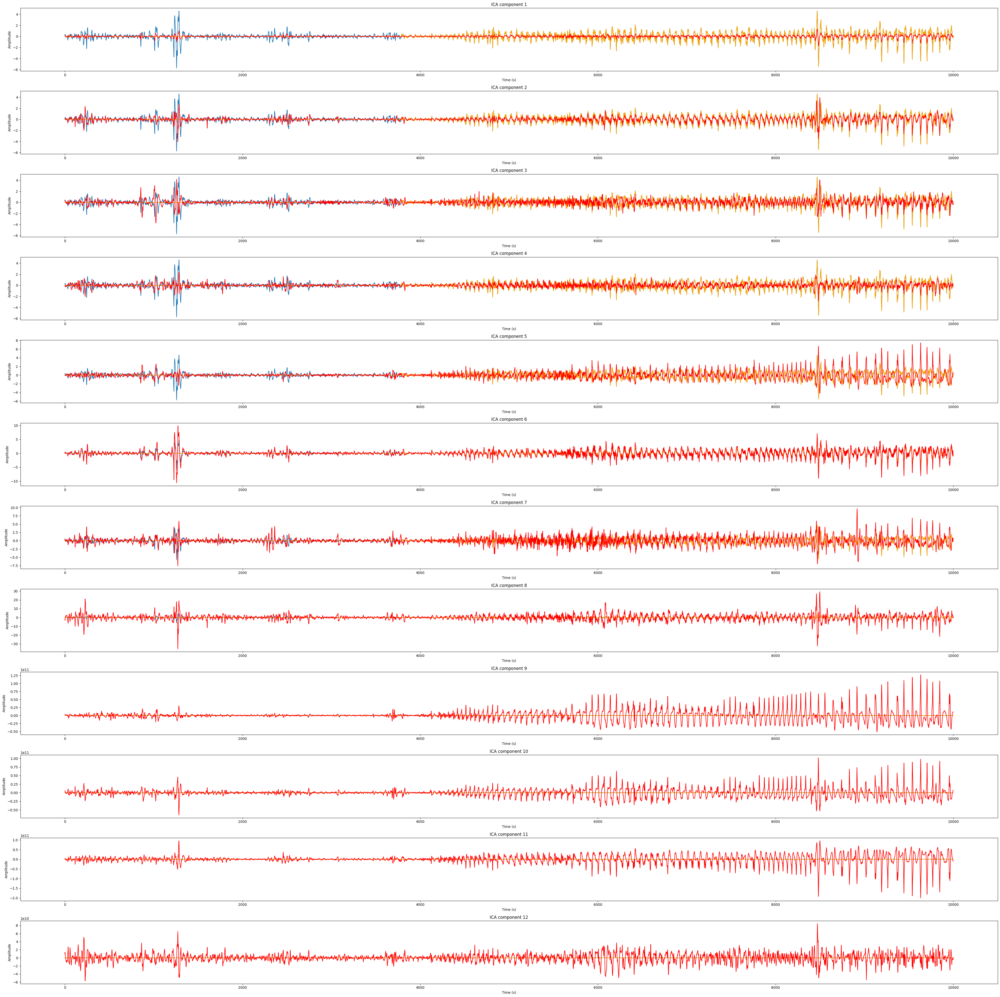

In [122]:
#plotting the signal sources
ax,fig=plt.subplots(12,1,figsize=(40,40))
#making a reference signal for plotting (average of all 12 signals)
ref=np.mean(clean_array,axis=0)*4
#there should be 12 plots on top of original signal
for i in range(12):
    sig_art=np.multiply(ref[t1:t2],valid_ans[valid_ans_keys[record_num]][t1:t2])
    t_art=np.multiply(t[t1:t2],valid_ans[valid_ans_keys[record_num]][t1:t2])
    fig[i].plot(ref[t1:t2])
    fig[i].plot(sig_art,color="orange")
    fig[i].plot(Sources[i,:],color="red")
    fig[i].set_title("ICA component "+str(i+1))
    fig[i].set_xlabel("Time (s)")
    fig[i].set_ylabel("Amplitude")
plt.tight_layout()
plt.show()

In [123]:
bad_channels=[]
for i in range(12):
    if abs(eog_scores[i])>0.3:
        bad_channels.append(i)
        Sources[i,:]=np.zeros((1,Sources.shape[1]))

#signal reconstruction
Reconstructed=np.dot(ica.mixing_matrix_.T,Sources)
print(bad_channels)

[0, 2, 3, 7]


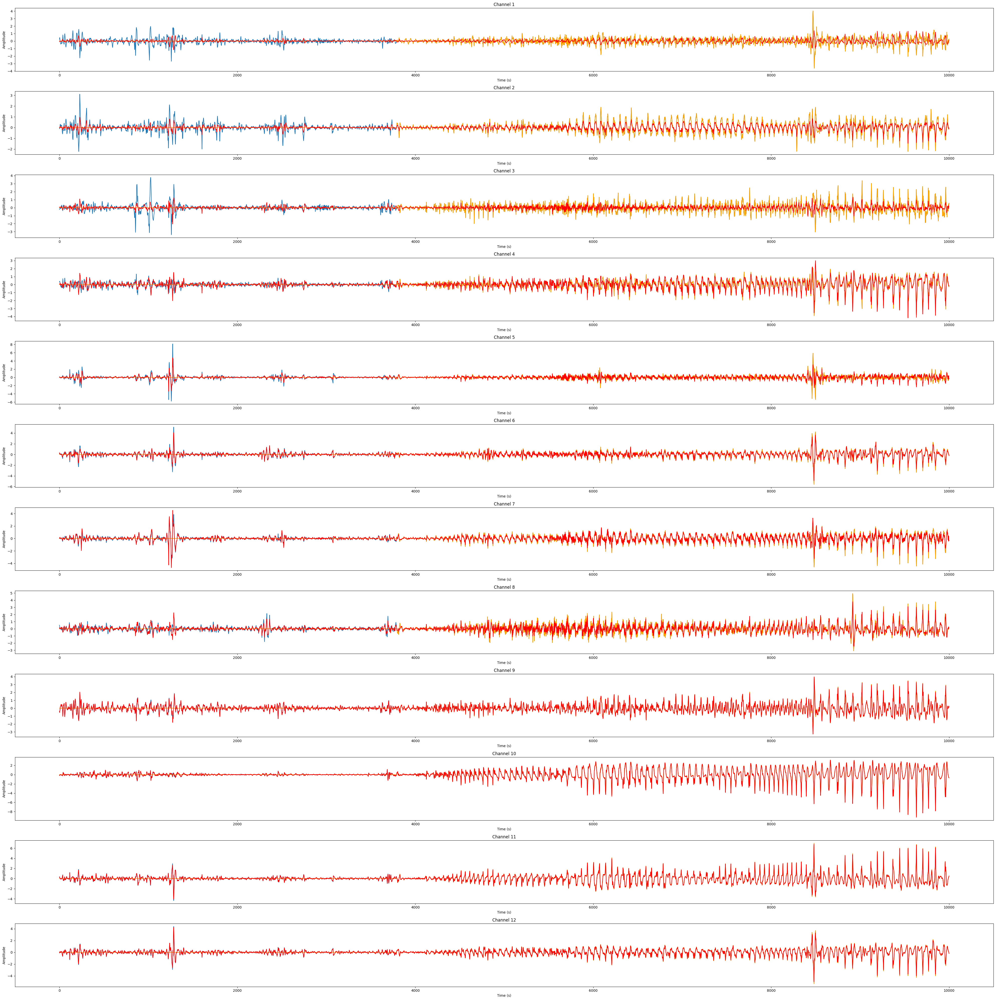

In [124]:
ax,fig=plt.subplots(12,1,figsize=(40,40))
#making a reference signal for plotting (average of all 12 signals)
ref=np.mean(clean_array,axis=0)*4
#there should be 12 plots on top of original signal
for i in range(12):
    sig_art=np.multiply(clean_array[i,t1:t2],valid_ans[valid_ans_keys[record_num]][t1:t2])
    t_art=np.multiply(t[t1:t2],valid_ans[valid_ans_keys[record_num]][t1:t2])
    fig[i].plot(clean_array[i,t1:t2])
    fig[i].plot(sig_art,color="orange")
    fig[i].plot(Reconstructed[i,:],color="red")
    fig[i].set_title("Channel "+str(i+1))
    fig[i].set_xlabel("Time (s)")
    fig[i].set_ylabel("Amplitude")
plt.tight_layout()
plt.show()

Visualizing the removed part of the signal

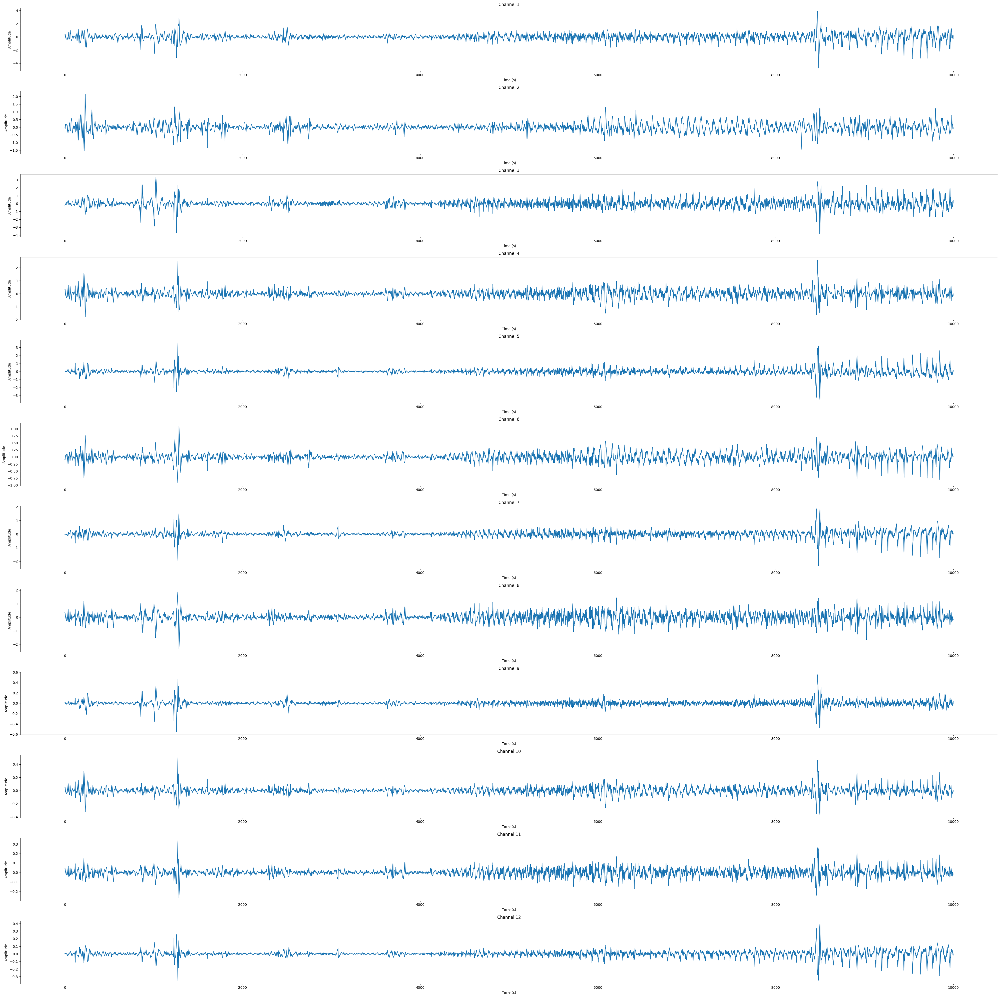

In [125]:
fig,ax=plt.subplots(12,1,figsize=(40,40))
for i in range(12):
    rem_sig=clean_array[i,t1:t2].copy()-Reconstructed[i,:]
    ax[i].plot(rem_sig)
    ax[i].set_title("Channel "+str(i+1))
    ax[i].set_xlabel("Time (s)")
    ax[i].set_ylabel("Amplitude")
plt.tight_layout()
plt.show()


Visualizing ICA

Seeing the frequency spectrums of the respective ICs

In [85]:
F_s,Pxx_den=[],[]
for i in range(12):
    f_s,p_s=psd(S_.T[i,:],fs=fs)
    F_s.append(f_s)
    Pxx_den.append(p_s)

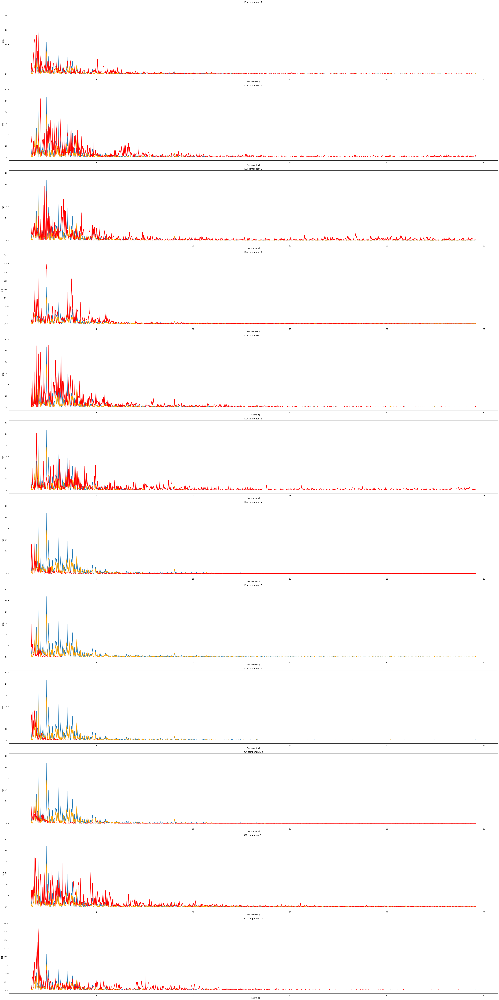

In [86]:
ax,fig=plt.subplots(12,1,figsize=(40,80))
#making a reference signal for plotting (average of all 12 signals)
ref=np.mean(clean_array,axis=0)*4
f_ref,p_ref=psd(ref[t1:t2],fs=fs)
sig_art=np.multiply(ref[t1:t2],valid_ans[valid_ans_keys[record_num]][t1:t2])
f_art,p_art=psd(sig_art,fs=fs)
#there should be 12 plots on top of original signal
f_1=1
f_2=15
for i in range(12):
    fig[i].plot(f_ref[f_1*fs:f_2*fs],p_ref[f_1*fs:f_2*fs])
    fig[i].plot(f_art[f_1*fs:f_2*fs],p_art[f_1*fs:f_2*fs],color="orange")
    fig[i].plot(F_s[i][f_1*fs:f_2*fs],Pxx_den[i][f_1*fs:f_2*fs],color="red")
    fig[i].set_title("ICA component "+str(i+1))
    fig[i].set_xlabel("Frequency (Hz)")
    fig[i].set_ylabel("PSD")
plt.tight_layout()
plt.show()


Extracting Features

In [87]:
from numpy.lib.stride_tricks import sliding_window_view
from scipy.stats import kurtosis,skew

Epochs=sliding_window_view(clean_array[:,t1:t2],fs,axis=1)
print(clean_array.shape,Epochs.shape)

Std_array=np.std(Epochs,axis=2)
Mean_array=np.mean(Epochs,axis=2)
kurtosis_array=kurtosis(Epochs,axis=2)
skew_array=skew(Epochs,axis=2)

(12, 454400) (12, 9873, 128)


Plotting the measurements

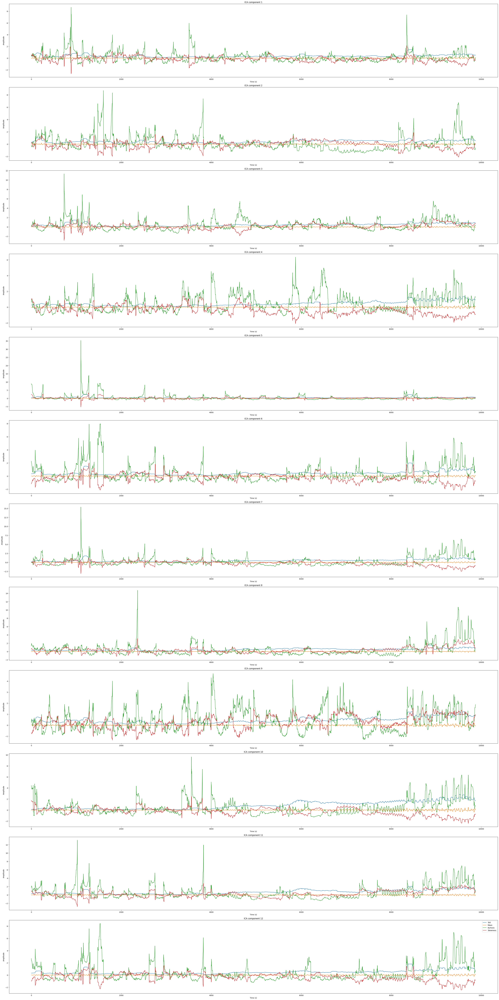

In [88]:
import matplotlib.pyplot as plt

ax,fig=plt.subplots(12,1,figsize=(40,80))
for i in range(12):
    fig[i].plot(Std_array[i,:])
    fig[i].plot(Mean_array[i,:])
    fig[i].plot(kurtosis_array[i,:])
    fig[i].plot(skew_array[i,:])
    fig[i].set_title("ICA component "+str(i+1))
    fig[i].set_xlabel("Time (s)")
    fig[i].set_ylabel("Amplitude")
plt.tight_layout()
plt.legend(["Std","Mean","Kurtosis","Skewness"])
plt.show()



Suppressing channels 1, 2, 6, 10, 12

In [89]:
Suppressing_channels=[1,4,7,9,11]
S_=S_.T
for i in Suppressing_channels:
    ch=i-1
    S_[ch,:]=S_[ch,:]*0
S_=S_.T

Reconstructing the signal

In [90]:
ICA_clean_array=np.dot(S_,A_.T)+ica.mean_
print(ICA_clean_array.shape)

AttributeError: 'ICA' object has no attribute 'mean_'

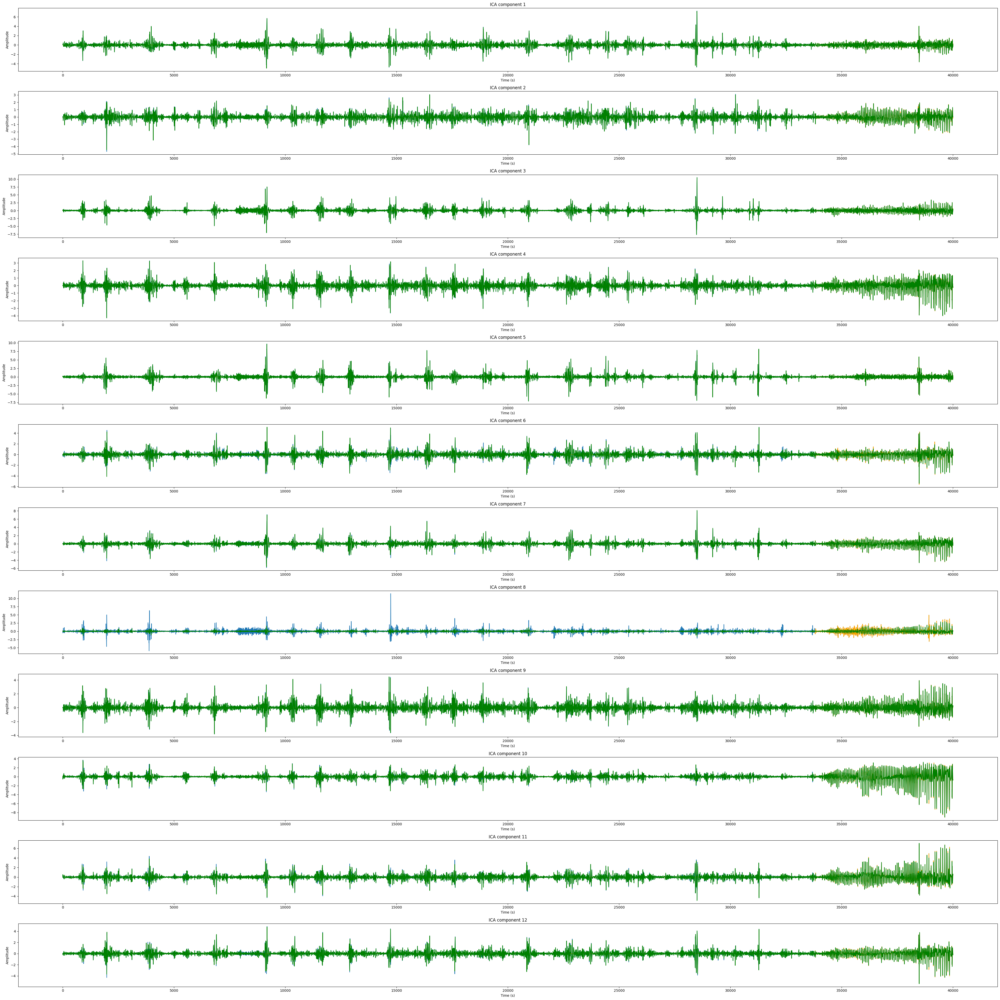

In [ ]:
ax,fig=plt.subplots(12,1,figsize=(40,40))
#there should be 12 plots on top of original signal
for i in range(12):
    sig_art=np.multiply(clean_array[i,t1:t2],valid_ans[valid_ans_keys[record_num]][t1:t2])
    t_art=np.multiply(t[t1:t2],valid_ans[valid_ans_keys[record_num]][t1:t2])
    fig[i].plot(clean_array[i,t1:t2])
    fig[i].plot(sig_art,color="orange")
    fig[i].plot(ICA_clean_array.T[i,:],color="green")
    fig[i].set_title("ICA component "+str(i+1))
    fig[i].set_xlabel("Time (s)")
    fig[i].set_ylabel("Amplitude")
plt.tight_layout()
plt.show()